# I. INTRODUCTION
___
- NAMA : SALMAN HAMKA DE QAIS
- BATCH : BSD 006
- TUGAS : GRADDED CHALLANGE 7
- OBJECTIVE :
- LATAR BELAKANG :
- PROBLEM STATEMENT :

# II. IMPORT LIBRARIES
___

  Mengimpor pustaka dalam Python adalah langkah penting untuk memanfaatkan fungsi-fungsi dan modul-modul yang sudah tersedia sehingga kita tidak perlu menulis ulang kode yang umum digunakan. Python memiliki pustaka standar yang kaya serta pustaka pihak ketiga yang dapat diinstal untuk menambah fungsionalitas.


In [1]:
# Import Libraries

# acces folder
import os
import glob
import random

# data loading
import numpy as np
import pandas as pd
import cv2

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocessing and Models
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Input
from sklearn.model_selection import train_test_split

# Model Evaluation
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score,classification_report,ConfusionMatrixDisplay,confusion_matrix
import warnings

import pdb
# transfer learning
import tensorflow_hub as hub
warnings.filterwarnings('ignore')

# III .LOADING DATA
___

  Melakukan loading data menjadi tahap setelah proses import libraries karena bertujuan untuk membaca data yang sudah kami sediakaan untuk di tampilkan.


In [2]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"salmanhamkadeqais","key":"a5c92d8e477907fd6d2cfe596e0e1ba9"}'}

In [3]:
#create a kaggle folder
! mkdir ~/.kaggle

In [4]:
#copy the kaggle.json to folder created
! cp kaggle.json ~/.kaggle/

In [5]:
#permission for the json to act
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
!kaggle datasets download -d gibranfadilla/indonesian-wayang-types

Dataset URL: https://www.kaggle.com/datasets/gibranfadilla/indonesian-wayang-types
License(s): CC0-1.0
 73% 33.0M/45.4M [00:00<00:00, 79.0MB/s]
100% 45.4M/45.4M [00:00<00:00, 91.2MB/s]


  tahap selanjutnya yaitu melakukan unzip folder indonesia-wayang-types agar dapat dibaca oleh colab

In [7]:
!unzip indonesian-wayang-types.zip

Archive:  indonesian-wayang-types.zip
  inflating: Wayangs/train/Wayang Beber/03e93ef85cc3183b22c89d8e3fee08e5.jpg  
  inflating: Wayangs/train/Wayang Beber/10-1.jpg  
  inflating: Wayangs/train/Wayang Beber/11-1.jpg  
  inflating: Wayangs/train/Wayang Beber/1554717798_lukisan_wayang_beber_by_wayangbeber_d3jme80.jpg  
  inflating: Wayangs/train/Wayang Beber/2017_07_17_29826_1500265011._large.jpg  
  inflating: Wayangs/train/Wayang Beber/366.jpg  
  inflating: Wayangs/train/Wayang Beber/50128c5c93b93a3e5eae1affa29b9191.jpg  
  inflating: Wayangs/train/Wayang Beber/6.jpg  
  inflating: Wayangs/train/Wayang Beber/8f904e9b4d6d9cc0918e5b7f505f1753.jpg  
  inflating: Wayangs/train/Wayang Beber/8mala.jpg  
  inflating: Wayangs/train/Wayang Beber/Abb36Gedompol.jpg  
  inflating: Wayangs/train/Wayang Beber/BW54zSKCQAEbV9T.jpg  
  inflating: Wayangs/train/Wayang Beber/Culture-1-1.jpg  
  inflating: Wayangs/train/Wayang Beber/Culture-4-copy.jpg  
  inflating: Wayangs/train/Wayang Beber/IMG_201407

melakukan proses create variables untuk path

In [8]:
# create variables for path
main_path= '/content/Wayangs'
os.listdir(main_path)


['train', 'val']

melakukan proses pembuatan variable untuk train dan test dengan melakukan perintah berikut

In [9]:
# create variable for train, test, testidation directory
train_dir = os.path.join(main_path, 'train')
test_dir = os.path.join(main_path, 'val')
print(train_dir)
print(test_dir)

/content/Wayangs/train
/content/Wayangs/val


In [10]:
# create variables train, test ,validation each for each class

#train

train_WayangBeber = len(os.listdir(os.path.join(train_dir, 'Wayang Beber')))
train_WayangGedog = len(os.listdir(os.path.join(train_dir, 'Wayang Gedog')))
train_WayangGolek = len(os.listdir(os.path.join(train_dir, 'Wayang Golek')))
train_WayangKrucil = len(os.listdir(os.path.join(train_dir, 'Wayang Krucil')))
train_WayangKulit = len(os.listdir(os.path.join(train_dir, 'Wayang Kulit')))
train_WayangSuluh = len(os.listdir(os.path.join(train_dir, 'Wayang Suluh')))

#validation

test_WayangBeber = len(os.listdir(os.path.join(test_dir, 'Wayang Beber')))
test_WayangGedog = len(os.listdir(os.path.join(test_dir, 'Wayang Gedog')))
test_WayangGolek = len(os.listdir(os.path.join(test_dir, 'Wayang Golek')))
test_WayangKrucil = len(os.listdir(os.path.join(test_dir, 'Wayang Krucil')))
test_WayangKulit = len(os.listdir(os.path.join(test_dir, 'Wayang Kulit')))
test_WayangSuluh = len(os.listdir(os.path.join(test_dir, 'Wayang Suluh')))

# data count

print('Train Dataset')
print('Count of train_Wayang Beber : ', train_WayangBeber)
print('Count of train_Wayang Gedog : ', train_WayangGedog)
print('Count of train_Wayang Golek : ', train_WayangGolek)
print('Count of train_Wayang Krucil : ', train_WayangKrucil)
print('Count of train_Wayang Kulit : ', train_WayangKulit)
print('Count of train_Wayang Suluh : ', train_WayangSuluh)

print('----------------')
print('Test Dataset')
print('Count of test_Wayang Beber : ', test_WayangBeber)
print('Count of test_Wayang Gedog : ', test_WayangGedog)
print('Count of test_Wayang Golek : ', test_WayangGolek)
print('Count of test_Wayang Krucil : ', test_WayangKrucil)
print('Count of test_Wayang Kulit : ', test_WayangKulit)
print('Count of test_Wayang Suluh : ', test_WayangSuluh)

Train Dataset
Count of train_Wayang Beber :  30
Count of train_Wayang Gedog :  26
Count of train_Wayang Golek :  30
Count of train_Wayang Krucil :  33
Count of train_Wayang Kulit :  35
Count of train_Wayang Suluh :  25
----------------
Test Dataset
Count of test_Wayang Beber :  10
Count of test_Wayang Gedog :  8
Count of test_Wayang Golek :  10
Count of test_Wayang Krucil :  8
Count of test_Wayang Kulit :  10
Count of test_Wayang Suluh :  8


In [11]:
# Create a variable from filepaths

#train

train_WayangBeber= glob.glob(train_dir + '/Wayang Beber/*.jpg')
train_WayangGedog= glob.glob(train_dir + '/Wayang Gedog/*.jpg')
train_WayangGolek= glob.glob(train_dir + '/Wayang Golek/*.jpg')
train_WayangKrucil= glob.glob(train_dir + '/Wayang Krucil/*.jpg')
train_WayangKulit= glob.glob(train_dir + '/Wayang Kulit/*.jpg')
train_WayangSuluh= glob.glob(train_dir + '/Wayang Suluh/*.jpg')

#validation
test_WayangBeber= glob.glob(test_dir + '/Wayang Beber/*.jpg')
test_WayangGedog= glob.glob(test_dir + '/Wayang Gedog/*.jpg')
test_WayangGolek= glob.glob(test_dir + '/Wayang Golek/*.jpg')
test_WayangKrucil= glob.glob(test_dir + '/Wayang Krucil/*.jpg')
test_WayangKulit= glob.glob(test_dir + '/Wayang Kulit/*.jpg')
test_WayangSuluh= glob.glob(test_dir + '/Wayang Suluh/*.jpg')


selanjutnya yaitu dengan membuat dataset train dan test.

In [12]:
# Creating dataset train, test, validation

def create_dataframe(list_of_images):
  data=[]
  for image in list_of_images:
    data.append((image, image.split('/')[-2]))

  return pd.DataFrame(data, columns= ['images', 'label'])

train_df = create_dataframe(train_WayangBeber + train_WayangGedog + train_WayangGolek + train_WayangKrucil + train_WayangKulit + train_WayangSuluh)
train_df = train_df.sample(frac=1, random_state=7).reset_index(drop=True)

test_df = create_dataframe(test_WayangBeber + test_WayangGedog + test_WayangGolek + test_WayangKrucil + test_WayangKulit + test_WayangSuluh)
test_df = test_df.sample(frac=1, random_state=7).reset_index(drop=True)



In [13]:
# np.random.randint(len(train_gen.next()[0]), size=16)

In [14]:
# # Show images of train-set

# fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
# n = 0

# for i in range(2):
#   for j in range(5):
#     img = train_gen[0][0][n].astype('uint8')
#     ax[i][j].imshow(img)
#     ax[i][j].set_title('Class - ' + str(train_gen[0][1][n]))
#     n += 1

In [15]:
# # Show images of val-set

# fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(10,5))
# n = 0

# for i in range(2):
#   for j in range(3):
#     img = val_gen[0][0][n].astype('uint8')
#     ax[i][j].imshow(img)
#     ax[i][j].set_title('Class - ' + str(val_gen[0][1][n]))
#     n += 1

# IV. EXPLORATORY DATA ANALISYS
___

  Proses EDA berfungsi untuk menampilkan jenis-jenis wayang yang ada dalam dataset, wayang tersebut berisi dari wayang Beber, wayang gedog, wayang golek, wayang krucil, dan wayang kulit serta juga menampilkan dari wayang suluh. Dibawah ini adalah perintah untuk membuat function nya.

In [16]:
#function to visualize each class

def visualize_samples_by_label(df, label, num_samples=20):
    samples = df[df['label'] == label]['images'].iloc[:num_samples].tolist()
    num_cols = min(num_samples, 5)
    num_rows = (num_samples - 1) // num_cols + 1
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(10, 2 * num_rows))
    count = 0
    for i in range(num_rows):
        for j in range(num_cols):
            if count < len(samples):
                sample = samples[count]
                img = cv2.imread(sample)
                ax = axes[i, j]
                ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
                ax.axis('off')
                count += 1
    plt.tight_layout()
    plt.show()

## a. WAYANG BEBER

dibawah ini adalah syntax untuk menampilkan visualisasi dari wayang beber, dan juga ada penjelasan dibawah gambar wayang beber tersebut.

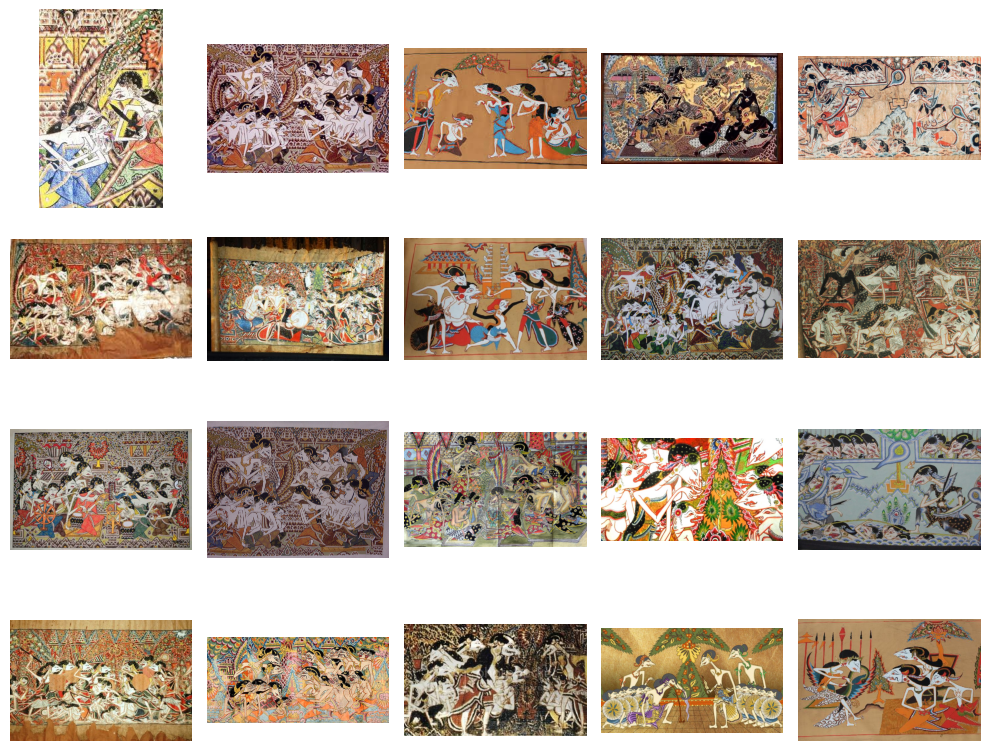

In [17]:
# visualize 'Wayang Beber' class
visualize_samples_by_label(train_df, 'Wayang Beber', num_samples=20)

**- Penjelasan :**


1. Wayang Beber adalah salah satu bentuk seni tradisional Indonesia yang berasal
dari Jawa. Wayang ini unik karena berbeda dengan wayang kulit atau wayang golek yang menggunakan boneka sebagai medianya.

2. Karakteristik Wayang Beber


*   Media dan Bahan:
  - Gulungan Kain atau Kertas: Cerita ditampilkan dalam bentuk lukisan di atas kain atau kertas yang digulung. Setiap gulungan dapat berisi beberapa adegan.
  - Lukisan: Lukisan pada gulungan biasanya menggunakan tinta atau cat tradisional dan memiliki warna-warna yang cerah.
*   Narasi
  - Dalang: Seperti dalam pertunjukan wayang lainnya, Wayang Beber juga dipimpin oleh seorang dalang. Dalang ini akan membuka gulungan secara perlahan dan menceritakan adegan-adegan yang tergambar sambil memberikan suara dan dialog untuk setiap karakter.
  - Cerita: Cerita yang ditampilkan seringkali berasal dari kisah-kisah klasik seperti Mahabharata, Ramayana, atau cerita rakyat lokal


*   Pertunjukan
   - Tempat: Pertunjukan Wayang Beber biasanya dilakukan di tempat-tempat tertutup seperti balai desa atau rumah adat, tetapi juga bisa diadakan di luar ruangan.
  - Musik Pengiring: Musik gamelan seringkali mengiringi pertunjukan untuk menambah suasana dramatis dan mendukung narasi yang dibawakan oleh dalang.

*   Gaya Visual
  - Gaya Tradisional: Lukisan pada Wayang Beber memiliki gaya yang sangat khas dengan garis-garis yang tegas dan warna-warna yang simbolis.
  - Detail: Detil pada lukisan sangat diperhatikan untuk menggambarkan ekspresi dan gerakan karakter dalam cerita.



*   Fungsi dan Makna
  - Edukasi dan Hiburan: Selain sebagai hiburan, Wayang Beber juga berfungsi sebagai media edukasi untuk menyampaikan nilai-nilai moral dan budaya kepada penonton.
  - Ritual: Beberapa pertunjukan Wayang Beber juga memiliki nilai ritual dan digunakan dalam upacara adat tertentu.













## b. Wayang Gedog

dibawah ini adalah syntax untuk menampilkan visualisasi dari wayang gedog, dan juga ada penjelasan dibawah gambar wayang gedod tersebut.

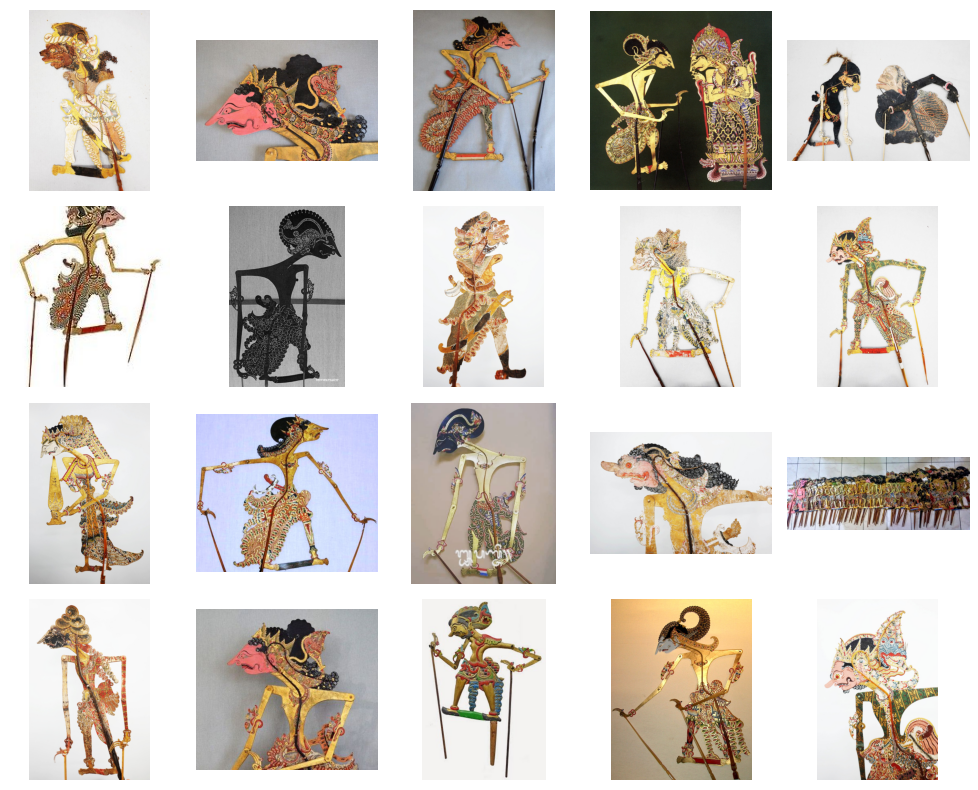

In [18]:
# visualize 'Wayang Gedog' class
visualize_samples_by_label(train_df, 'Wayang Gedog', num_samples=20)

- **Penjelasan** :

  Wayang Gedog adalah salah satu jenis wayang dari Indonesia yang khusus menceritakan kisah-kisah dari Panji, sebuah cerita klasik Jawa. Kata "gedog" berasal dari "kedok," yang berarti topeng, karena beberapa tokoh dalam pertunjukan ini mengenakan topeng.

**Wayang Gedog: Penjelasan dan Karakteristik Utama**
1. Cerita:

  Kisah Panji: Petualangan Raden Panji Inu Kertapati dan Dewi Sekartaji.

2. Tokoh:

  Raden Panji: Pahlawan utama yang bijaksana.

  Dewi Sekartaji: Kekasih Panji yang setia.

3. Media:

  Wayang Kulit atau Topeng: Menggunakan boneka wayang kulit atau aktor bertopeng.

4. Gaya Visual:

  Wayang Kulit: Desain detail dan ornamen khas Jawa Timur.

  Topeng: Aktor memakai topeng indah yang mencerminkan karakter.

5. Pertunjukan:

  Dalang: Menggerakkan wayang atau mengatur aktor dan menceritakan kisah.

  Musik Gamelan: Musik gamelan Jawa sebagai pengiring.

6. Fungsi dan Makna:

  Edukasi dan Moral: Pesan moral tentang kepahlawanan, kesetiaan, dan cinta sejati.

  Hiburan dan Ritual: Hiburan serta digunakan dalam upacara adat dan ritual.





## c. Wayang Golek

dibawah ini adalah syntax untuk menampilkan visualisasi dari wayang golek, dan juga ada penjelasan dibawah gambar wayang golek tersebut.

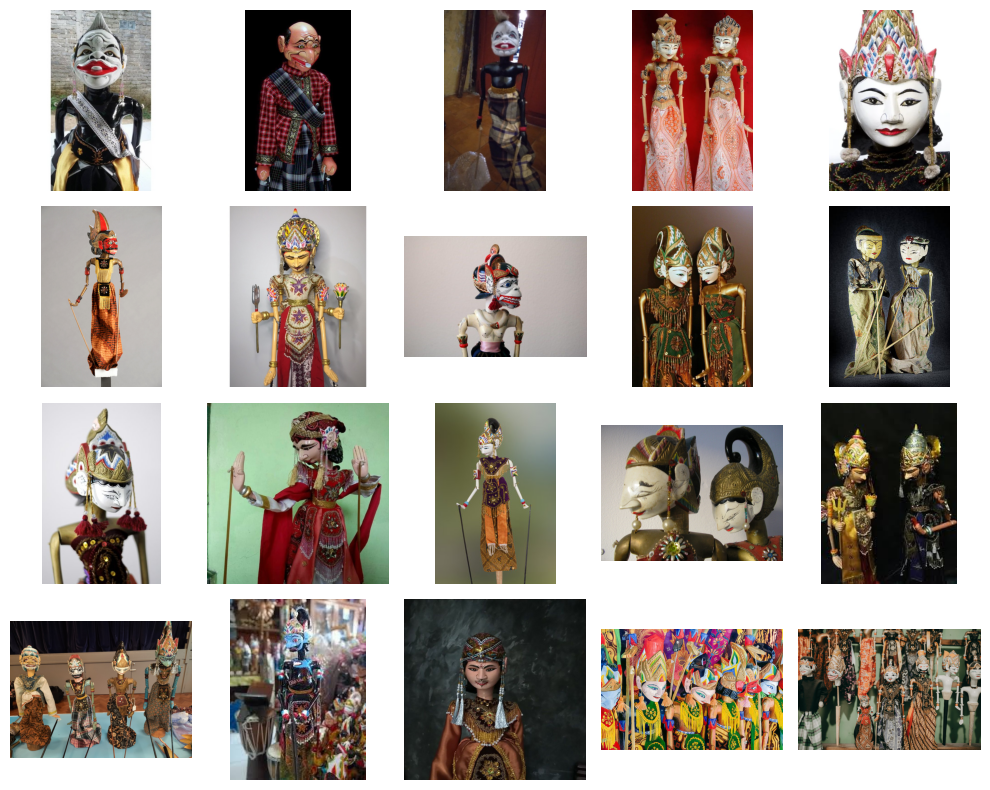

In [19]:
# visualize 'Wayang Golek' class
visualize_samples_by_label(train_df, 'Wayang Golek', num_samples=20)

- **PENJELASAN :**

  Wayang Golek adalah salah satu bentuk seni pertunjukan wayang dari Indonesia, yang terutama berkembang di Jawa Barat

  Wayang Golek adalah pertunjukan wayang yang menggunakan boneka kayu berukuran sekitar 50 cm hingga 75 cm yang diukir dan dicat dengan detail, menggambarkan karakter-karakter dari cerita tradisional seperti Ramayana dan Mahabharata serta cerita-cerita lokal Sunda.

- **Karakteristik Utama Wayang Golek**

  1. Media dan Bahan:

    Boneka Kayu: Boneka yang digunakan terbuat dari kayu, diukir dan dicat dengan detail, serta dilengkapi dengan kostum yang terbuat dari kain.

    Tiga Dimensi: Boneka-boneka ini memiliki bentuk tiga dimensi, berbeda dengan wayang kulit yang datar.

  2. Cerita:

    Epos Ramayana dan Mahabharata: Mengisahkan cerita-cerita klasik dari dua epos besar India.

    Cerita Lokal: Beberapa pertunjukan juga mengambil cerita lokal Sunda seperti kisah-kisah kerajaan Pajajaran.

  3. Tokoh:

    Rama, Sinta, Arjuna, Bima: Tokoh-tokoh utama dari Ramayana dan Mahabharata.

    Semar, Petruk, Gareng, Bagong: Karakter punakawan yang seringkali memberikan humor dan nasihat.

  4. Pertunjukan:

    Dalang: Dipimpin oleh seorang dalang yang menggerakkan boneka-boneka tersebut serta menceritakan kisah.

    Musik Gamelan: Pertunjukan diiringi oleh musik gamelan yang khas dari Jawa Barat.

  5. Gaya Visual:

    Detail dan Ornamen: Boneka-boneka wayang golek diukir dengan sangat detail, menggambarkan karakteristik dan ekspresi masing-masing tokoh.

    Kostum: Setiap boneka dilengkapi dengan kostum tradisional yang indah dan berwarna-warni.

  6. Fungsi dan Makna:

    Edukasi dan Moral: Mengandung pesan-pesan moral, pendidikan, dan nilai-nilai kehidupan yang disampaikan melalui cerita.

    Hiburan dan Ritual: Selain sebagai hiburan, pertunjukan Wayang Golek juga memiliki nilai-nilai spiritual dan ritual dalam budaya Sunda.

## d. Wayang Krucil

dibawah ini adalah syntax untuk menampilkan visualisasi dari wayang krucil, dan juga ada penjelasan dibawah gambar wayang krucil tersebut.

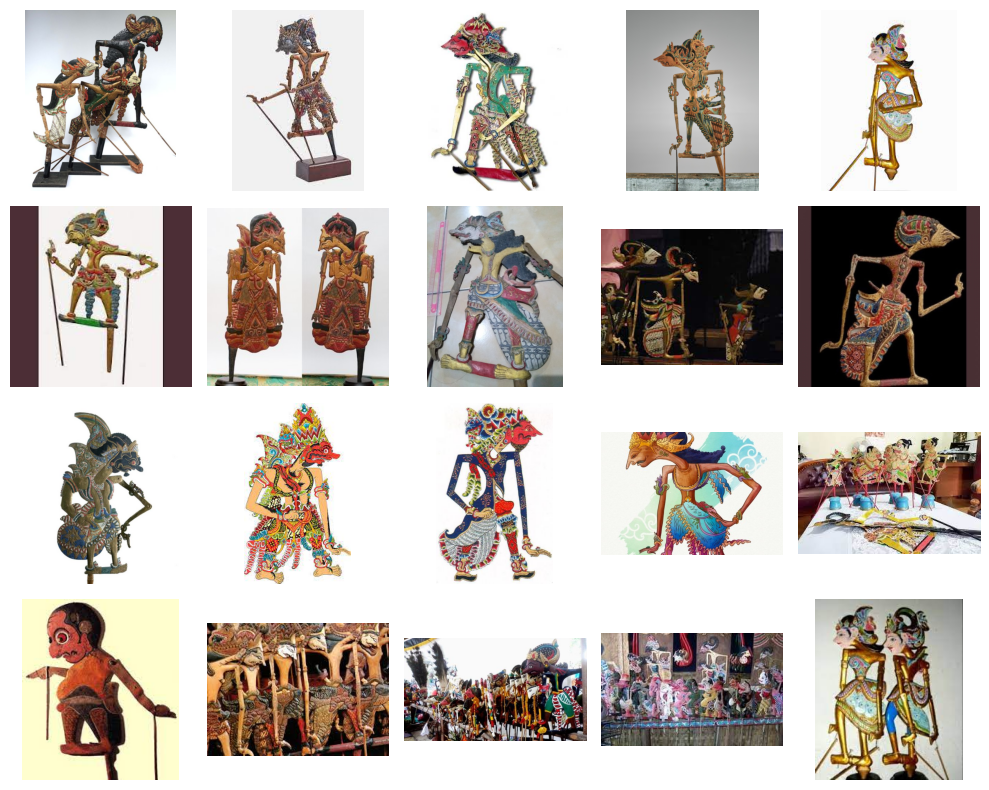

In [20]:
# visualize 'Wayang Krucil' class
visualize_samples_by_label(train_df, 'Wayang Krucil', num_samples=20)

- **PENJELASAN:**

  Wayang Krucil, juga dikenal sebagai Wayang Klithik atau Wayang Krucil Klithik, adalah bentuk pertunjukan wayang yang menggunakan boneka kayu pipih sebagai media utamanya. Kata "krucil" sendiri merujuk pada bentuk boneka yang kecil dan pipih. Wayang Krucil adalah salah satu jenis wayang yang berkembang di Jawa Tengah dan Jawa Timur, Indonesia.

- **Karakteristik Utama Wayang Krucil**

  1. Media dan Bahan:

  Boneka Kayu Pipih: Boneka-boneka ini terbuat dari kayu yang dipahat pipih dan dicat untuk menggambarkan berbagai karakter. Ukurannya lebih kecil dibandingkan wayang golek.

  Tiga Dimensi Parsial: Meskipun pipih, beberapa bagian boneka seperti kepala dan tangan mungkin sedikit lebih menonjol untuk memberikan kesan tiga dimensi.

  2. Cerita:

  Kisah Panji: Banyak pertunjukan Wayang Krucil yang menceritakan kisah-kisah Panji, yang merupakan cerita kepahlawanan dan romansa dari kerajaan-kerajaan Jawa.

  Cerita Lokal dan Kepahlawanan: Selain kisah Panji, juga terdapat cerita-cerita lokal lainnya yang mengandung nilai-nilai kepahlawanan dan moral.

  3. Tokoh:

  Raden Panji: Tokoh utama dalam cerita Panji.
  Dewi Sekartaji: Kekasih Raden Panji yang menjadi pusat dari banyak cerita.
  Tokoh-tokoh lain: Berbagai karakter pendukung baik protagonis maupun antagonis.

  4. Pertunjukan:

  Dalang: Seperti dalam wayang lainnya, pertunjukan dipimpin oleh seorang dalang yang menggerakkan boneka-boneka tersebut dan menceritakan kisah.

  Musik Pengiring: Diiringi oleh musik gamelan, yang menambah atmosfer dramatik dalam pertunjukan.

  5. Gaya Visual:

  Detail dan Ornamen: Meskipun pipih, boneka Wayang Krucil memiliki detail yang cukup rumit dengan ornamen khas.

  Kostum Tradisional: Boneka-boneka ini biasanya mengenakan kostum tradisional yang menggambarkan pakaian dari zaman kerajaan Jawa.

  6. Fungsi dan Makna:

  Edukasi dan Moral: Pertunjukan Wayang Krucil sering kali digunakan untuk menyampaikan pesan-pesan moral dan nilai-nilai kehidupan.
  
  Hiburan dan Tradisi: Selain sebagai hiburan, pertunjukan ini juga merupakan bagian dari tradisi dan upacara adat tertentu.

## e. Wayang Kulit

dibawah ini adalah syntax untuk menampilkan visualisasi dari wayang kulit, dan juga ada penjelasan dibawah gambar wayang kulit tersebut.

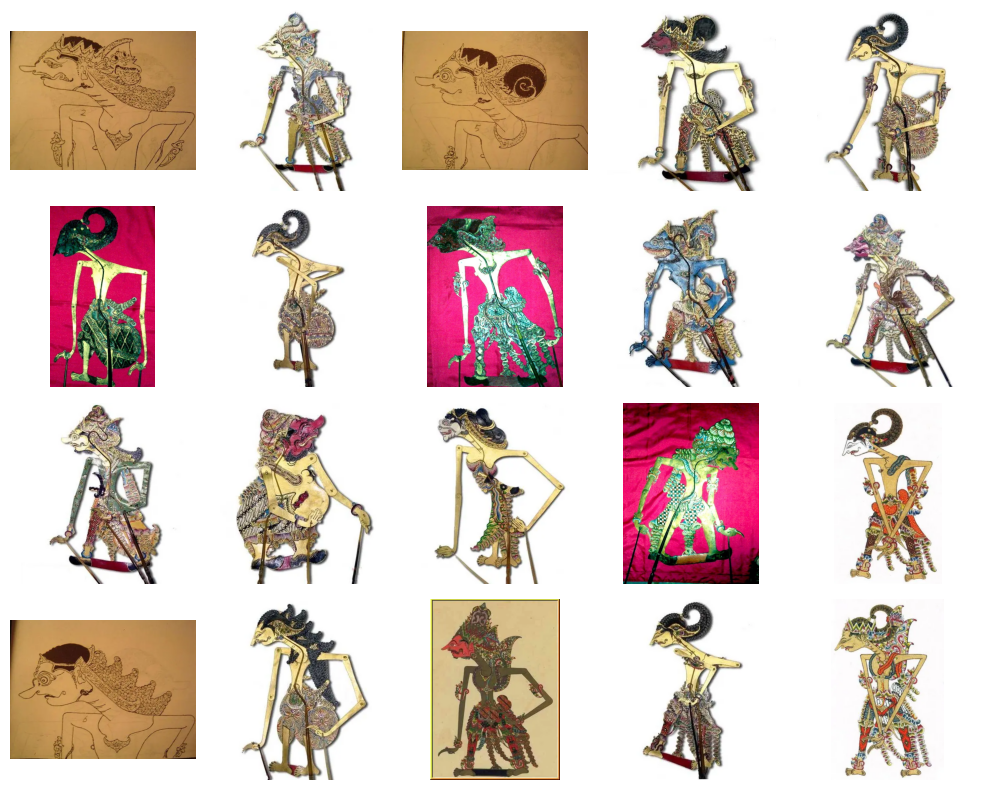

In [21]:
# visualize 'Wayang Kulit' class
visualize_samples_by_label(train_df, 'Wayang Kulit', num_samples=20)

**PENJELASAN:**

  Wayang Kulit adalah salah satu bentuk seni pertunjukan wayang yang paling terkenal di Indonesia, khususnya di Jawa dan Bali. Pertunjukan ini menggunakan boneka pipih yang terbuat dari kulit kerbau atau kambing yang diukir dan dicat, dan dimainkan oleh seorang dalang di balik layar yang diterangi oleh lampu.

**  Karakteristik Utama Wayang Kulit**

  1. Media dan Bahan:

  Boneka Kulit: Boneka-boneka ini terbuat dari kulit kerbau atau kambing yang diukir dengan sangat detail dan dicat dengan warna-warna cerah. Setiap boneka dilengkapi dengan batang kayu yang digunakan untuk menggerakkan bagian tubuhnya.

  Layar (Kelir): Pertunjukan dilakukan di balik layar putih (kelir) yang diterangi oleh lampu minyak atau listrik, menciptakan bayangan boneka yang terlihat oleh penonton.

  2. Cerita:

  Epos Ramayana dan Mahabharata: Mengisahkan petualangan, perjuangan, dan kehidupan para dewa, ksatria, dan tokoh-tokoh dari dua epos besar ini.

  Cerita Lokal: Beberapa pertunjukan juga mengangkat cerita-cerita lokal, sejarah kerajaan, dan mitos-mitos Jawa.

3. Tokoh:

  Rama, Sinta, Arjuna, Bima: Tokoh-tokoh utama dari epos Ramayana dan Mahabharata.
  Semar, Petruk, Gareng, Bagong: Karakter punakawan yang sering kali memberikan humor dan nasihat bijak.

4. Pertunjukan:

  Dalang: Dalang adalah pusat dari pertunjukan, menggerakkan boneka, mengatur dialog, dan memberikan suara kepada setiap karakter. Dalang juga memainkan instrumen gamelan kecil yang disebut keprak.

  Musik Gamelan: Pertunjukan diiringi oleh musik gamelan yang khas, yang terdiri dari berbagai instrumen seperti gong, kendang, saron, dan lain-lain.

5. Gaya Visual:

  Detail dan Ornamen: Boneka-boneka Wayang Kulit diukir dengan sangat detail, mencerminkan karakteristik fisik dan pakaian dari masing-masing tokoh.

  Bayangan: Bayangan yang dihasilkan oleh boneka di balik layar menciptakan efek visual yang unik dan dramatis.

6. Fungsi dan Makna:

  Edukasi dan Moral: Pertunjukan Wayang Kulit menyampaikan nilai-nilai moral, filosofis, dan ajaran hidup yang penting.

  Hiburan dan Ritual: Selain sebagai hiburan, Wayang Kulit juga sering digunakan dalam upacara adat dan ritual keagamaan, serta memiliki makna spiritual yang mendalam bagi masyarakat Jawa dan Bali.

## f. Wayang Suluh

dibawah ini adalah syntax untuk menampilkan visualisasi dari wayang suluh, dan juga ada penjelasan dibawah gambar wayang suluh tersebut.

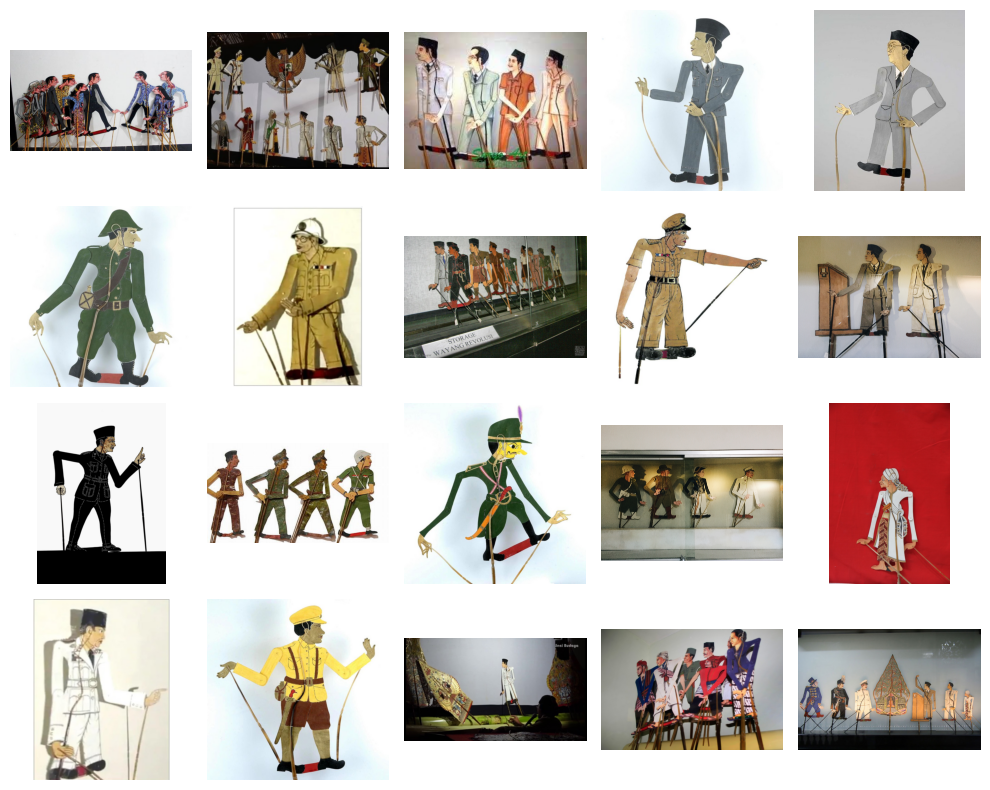

In [22]:
  # visualize 'Wayang Suluh' class
visualize_samples_by_label(train_df, 'Wayang Suluh', num_samples=20)

**Penjelasan Wayang Sulu**

  Wayang Sulu merupakan seni pertunjukan wayang yang berasal dari Jawa Tengah. Nama "Sulu" sendiri berasal dari bahasa Jawa yang berarti "dipukul" atau "disambar", merujuk pada teknik dalang dalam memainkan pertunjukan ini.

**Karakteristik Utama Wayang Sulu**

  1. Media dan Bahan:

  Boneka Lembut: Wayang Sulu menggunakan boneka berbahan dasar kain yang lembut, berbeda dengan boneka kayu atau kulit yang khas digunakan dalam wayang lainnya.

  Kain atau Kertas: Boneka-boneka ini terbuat dari lembaran kain atau kertas yang dicetak dengan gambar tokoh-tokoh wayang.

  2. Cerita:

  Cerita Pewayangan Jawa: Mengisahkan kisah-kisah pewayangan klasik seperti Ramayana, Mahabharata, atau cerita-cerita Panji.

  Adaptasi Cerita Lokal: Beberapa pertunjukan juga mengadaptasi cerita-cerita lokal atau menampilkan kisah-kisah yang lebih modern.

  3. Tokoh:

  Tokoh Pewayangan: Seperti Rama, Sinta, Arjuna, Bima, dan tokoh-tokoh lain yang populer dalam pewayangan Jawa.

  Tokoh-tokoh Lokal: Kadang-kadang menampilkan tokoh-tokoh lokal atau cerita-cerita sesuai dengan konteks masyarakat setempat.

  4. Pertunjukan:

  Teknik Dalang: Dalang memainkan boneka-boneka Sulu dengan cara dipukul atau disambar untuk menggerakkan mereka dan menceritakan kisah.

  Penyertaan Musik: Seperti dalam pertunjukan wayang lainnya, Wayang Sulu diiringi oleh musik gamelan yang melengkapi suasana dramatik pertunjukan.

  5. Gaya Visual:

  Sederhana Namun Bermakna: Meskipun sederhana dalam pembuatannya, boneka-boneka Wayang Sulu mampu menggambarkan karakteristik dan ekspresi tokoh dengan baik.

  Kreativitas dalam Pembuatan: Dapat menggambarkan karakter dengan berbagai gaya dan ekspresi yang unik.

  6. Fungsi dan Makna:

  Edukasi dan Hiburan: Sama seperti wayang lainnya, Wayang Sulu memiliki fungsi untuk mengedukasi penonton tentang nilai-nilai moral dan kultural sambil memberikan hiburan.

  Pelestarian Budaya: Mengembangkan dan melestarikan warisan budaya dan tradisi pewayangan Jawa, serta mempromosikan nilai-nilai budaya kepada generasi muda.

# V. Feature Engineering

## A. Split train, test, and val data & Augmentasi

Proses augmentasi data sangat penting dalam pelatihan model pembelajaran mesin untuk meningkatkan generalisasi dan kinerja model. Dalam contoh ini, kita akan menggunakan `tf.keras.preprocessing.image.ImageDataGenerator` untuk augmentasi data gambar serta memuat data untuk pelatihan, validasi, dan pengujian model.


**Penjelasan**

Import Pustaka:
  - Kita mengimpor pustaka tensorflow, ImageDataGenerator, dan matplotlib.pyplot.

Mengatur Augmentasi Data:
  - Kita membuat objek ImageDataGenerator dengan berbagai parameter augmentasi seperti pergeseran lebar dan tinggi, rotasi, shear, zoom, dan split validasi.

Memuat Data Gambar:
  - Menggunakan flow_from_directory untuk memuat data gambar dari direktori yang ditentukan.

  - Data dibagi menjadi set pelatihan dan validasi menggunakan parameter subset.

Menampilkan Gambar:
  - Kita membuat grid 2x5 dan menampilkan beberapa gambar dari set pelatihan untuk melihat hasil augmentasi.

Found 108 images belonging to 6 classes.
Found 71 images belonging to 6 classes.
Found 54 images belonging to 6 classes.


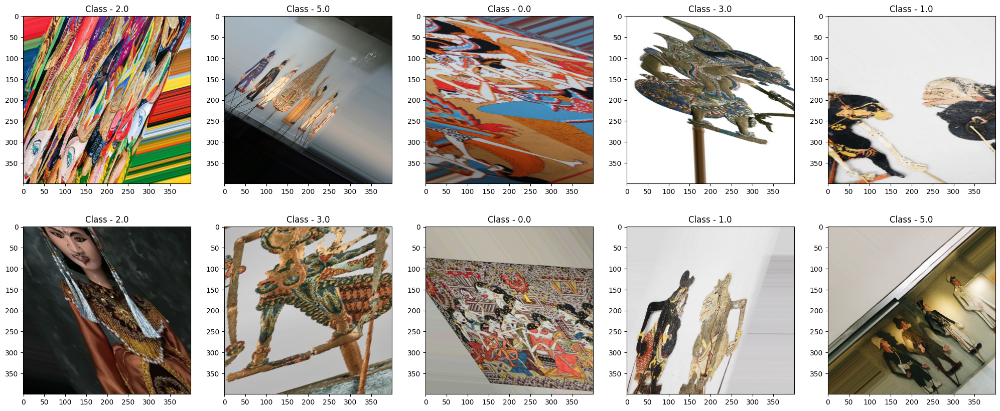

In [23]:
# Data Augmentation - Combine all previous data augmentations
imgen3 = tf.keras.preprocessing.image.ImageDataGenerator(width_shift_range=[-50, 50],
                                                         height_shift_range=[-50, 50],
                                                         rotation_range=45,
                                                         shear_range=50,
                                                         validation_split=0.4,
                                                         zoom_range =[0.3, 1.5])
test_imgen = ImageDataGenerator(rescale=1./255.)

train_gen = imgen3.flow_from_directory('/content/Wayangs/train',
                                    target_size=(400,400),
                                    class_mode='binary',
                                    subset='training',
                                    shuffle=True,
                                    seed=2)
val_gen= imgen3.flow_from_directory('/content/Wayangs/train',
                                  target_size=(400,400),
                                  class_mode='binary',
                                  subset='validation',
                                  shuffle=True,
                                  seed=2)
test_gen = test_imgen.flow_from_directory('/content/Wayangs/val',
                                    target_size=(400,400),
                                    class_mode='binary',
                                    shuffle=True,
                                    seed=2)
# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25,10))
n = 0

for i in range(2):
  for j in range(5):
    img = train_gen[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    ax[i][j].set_title('Class - ' + str(train_gen[0][1][n]))
    n += 1




**PENJELASAN :**

Pada langkah ini, kita akan menampilkan beberapa gambar dari set validasi untuk memeriksa hasil augmentasi dan memastikan data telah dimuat dengan benar.


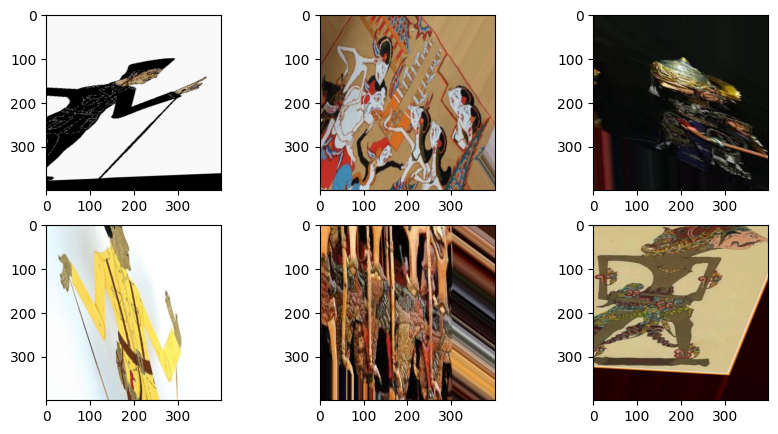

In [24]:
# Show images of val-set

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(10,5))
n = 0

for i in range(2):
  for j in range(3):
    img = val_gen[0][0][n].astype('uint8')
    ax[i][j].imshow(img)
    # ax[i][j].set_title('Class - ' + str(val_gen[0][1][n]))
    n += 1

# VI. MODEL DEFINITION
___

**PENJELASAN :**

  Callback dalam Keras digunakan untuk memantau kinerja model selama pelatihan dan mengambil tindakan tertentu berdasarkan kondisi yang terjadi. Berikut adalah contoh cara membuat callback untuk menghentikan pelatihan dini dan menyimpan model terbaik.


In [25]:
# create callbacks

callbacks = [
    EarlyStopping(monitor='val_loss', patience = 10),
    ModelCheckpoint('model.hdf5', monitor='val_loss', save_best_only=True)
]

## A.1 SEQUENTIAL
___

  Model ini menggunakan Keras untuk membangun sebuah Convolutional Neural Network (CNN) yang terdiri dari dua lapisan konvolusi dengan aktivasi ReLU, diikuti oleh lapisan MaxPooling untuk pengurangan dimensi. Setelah itu, data di-flatten untuk disiapkan menjadi input untuk lapisan Dense, yang terdiri dari 32 neuron dengan fungsi aktivasi ReLU sebagai lapisan tersembunyi. Lapisan output terdiri dari 15 neuron dengan aktivasi softmax untuk klasifikasi multi-kelas. Ringkasan model menunjukkan jumlah parameter yang dapat dioptimalkan dan struktur keseluruhan dari arsitektur yang dibangun.


In [26]:
# Model Arsitecture
model= Sequential()

#Layer Conv 1,
# model.add(Conv2D(filters=16, kernel_size=3, activation='relu',
#                        input_shape=input))
model.add(Conv2D(filters=32, kernel_size=3, activation='relu', padding= 'same', input_shape=(400, 400, 3)))
model.add(MaxPooling2D(pool_size=2, strides=2))

#Layer Conv 2
model.add(Conv2D(filters=32, kernel_size=3, activation='relu', padding= 'same'))
model.add(MaxPooling2D(pool_size=2, strides=2))

#Flatten
model.add(Flatten())

#Hidden Layer
model.add(Dense(units=32, activation='relu'))

#Output Layer
model.add(Dense(units=15, activation='softmax'))

#Summary
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 400, 400, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 200, 200, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 200, 200, 32)      9248      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 100, 100, 32)      0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 320000)            0         
                                                                 
 dense (Dense)               (None, 32)                1

  Model ini dikompilasi menggunakan optimizer Adam, yang merupakan optimizer yang efisien untuk pelatihan neural network. Fungsi loss yang digunakan adalah Sparse Categorical Crossentropy, cocok untuk tugas klasifikasi multi-kelas dimana labelnya dalam bentuk integer. Parameter from_logits=True menandakan bahwa output model belum melalui aktivasi softmax sehingga diproses secara langsung dalam perhitungan loss. Metrik yang digunakan untuk evaluasi performa model adalah akurasi, yang mengukur sejauh mana model berhasil mengklasifikasikan data dengan benar berdasarkan prediksi terhadap label yang sebenarnya.


In [27]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

## A.2 Model Improvement

  Dalam kode ini, model Xception dimuat menggunakan `tf.keras.applications.Xception`. Parameter `include_top=False` menandakan bahwa lapisan fully-connected teratas tidak akan dimuat, yang cocok untuk penggunaan transfer learning di mana kita ingin menggunakan model untuk tugas klasifikasi yang berbeda. Parameter `input_shape=(400, 400, 3)` menentukan bentuk input yang sesuai dengan dimensi gambar berwarna berukuran 400x400 piksel. Opsi `pooling='avg'` menentukan bahwa output dari Xception akan di-pooling secara rata-rata sebelum dihubungkan ke lapisan output kustom yang akan ditambahkan selanjutnya. Setelah model dimuat, `pretrained_model.trainable = False` mengatur agar bobot dari model Xception tidak dapat di-update selama pelatihan, yang menjaga representasi fitur yang telah dipelajari dari data sebelumnya.


In [28]:
# Tentukan bentuk input yang benar
input_shape = (400, 400, 3)

# Buat model Xception dengan bentuk input yang benar
pretrained_model = tf.keras.applications.Xception(include_top=False,
                                                  input_shape=input_shape,
                                                  pooling='avg')
pretrained_model.trainable = False



83683744/83683744 [==============================] - 0s 0us/step


In [29]:
# Tampilkan arsitektur model
pretrained_model.summary()

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 400, 400, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 199, 199, 32)         864       ['input_1[0][0]']             
                                                                                                  
 block1_conv1_bn (BatchNorm  (None, 199, 199, 32)         128       ['block1_conv1[0][0]']        
 alization)                                                                                       
                                                                                                  
 block1_conv1_act (Activati  (None, 199, 199, 32)         0         ['block1_conv1_bn[0][0]

In [30]:
# Model Definition
model_tf= Sequential()
model_tf.add(pretrained_model) # add Xception for Transfer Learning

#fully connected layer
model_tf.add(Flatten())
model_tf.add(Dense(32, activation='relu')),
model_tf.add(Dense(units=15,activation='softmax'))

In [31]:
model_tf.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [32]:
model_tf.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 2048)              20861480  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 32)                65568     
                                                                 
 dense_3 (Dense)             (None, 15)                495       
                                                                 
Total params: 20927543 (79.83 MB)
Trainable params: 66063 (258.06 KB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


# VII. MODEL TRAINING
___

## A.1 SEQUENTIAL

In [33]:
# Training Based Model
%%time
history= model.fit(train_gen, batch_size=32,
                           epochs= 20, validation_data= val_gen,
                           callbacks= callbacks)


Epoch 1/20
4/4 [==============================] - 16s 3s/step - loss: 1029.6764 - accuracy: 0.1389 - val_loss: 709.9917 - val_accuracy: 0.1831
Epoch 2/20
4/4 [==============================] - 9s 3s/step - loss: 173.1617 - accuracy: 0.1389 - val_loss: 34.8059 - val_accuracy: 0.0845
Epoch 3/20
4/4 [==============================] - 9s 3s/step - loss: 18.6478 - accuracy: 0.1667 - val_loss: 7.1179 - val_accuracy: 0.1549
Epoch 4/20
4/4 [==============================] - 8s 2s/step - loss: 4.2141 - accuracy: 0.2870 - val_loss: 2.8957 - val_accuracy: 0.2254
Epoch 5/20
4/4 [==============================] - 8s 2s/step - loss: 2.5700 - accuracy: 0.1944 - val_loss: 2.4729 - val_accuracy: 0.2113
Epoch 6/20
4/4 [==============================] - 8s 2s/step - loss: 2.2976 - accuracy: 0.2407 - val_loss: 2.5730 - val_accuracy: 0.2113
Epoch 7/20
4/4 [==============================] - 15s 4s/step - loss: 2.4066 - accuracy: 0.1759 - val_loss: 2.6575 - val_accuracy: 0.2394
Epoch 8/20
4/4 [==============

## A.2 Improvement

In [34]:
# Training Improvement Model
%%time
history4= model_tf.fit(train_gen, batch_size=32,
                           epochs= 20, validation_data= val_gen,
                           callbacks= callbacks)

Epoch 1/20
4/4 [==============================] - 25s 6s/step - loss: 26.4036 - accuracy: 0.0556 - val_loss: 15.7405 - val_accuracy: 0.1408
Epoch 2/20
4/4 [==============================] - 9s 2s/step - loss: 14.3191 - accuracy: 0.1296 - val_loss: 14.3595 - val_accuracy: 0.1549
Epoch 3/20
4/4 [==============================] - 9s 3s/step - loss: 11.3919 - accuracy: 0.1389 - val_loss: 9.8843 - val_accuracy: 0.2113
Epoch 4/20
4/4 [==============================] - 8s 2s/step - loss: 7.3800 - accuracy: 0.2685 - val_loss: 8.0581 - val_accuracy: 0.3239
Epoch 5/20
4/4 [==============================] - 9s 3s/step - loss: 5.7982 - accuracy: 0.2685 - val_loss: 6.6176 - val_accuracy: 0.2535
Epoch 6/20
4/4 [==============================] - 9s 3s/step - loss: 4.5819 - accuracy: 0.3241 - val_loss: 6.3785 - val_accuracy: 0.2676
Epoch 7/20
4/4 [==============================] - 8s 2s/step - loss: 3.6152 - accuracy: 0.3333 - val_loss: 5.0070 - val_accuracy: 0.3662
Epoch 8/20
4/4 [===================

# VIII. MODEL EVALUATION
___

## A. Sequential

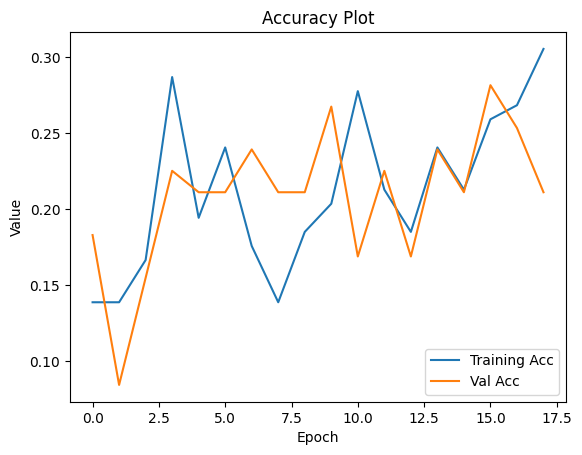

In [35]:
# plot result Based Model

plt.plot(history.history['accuracy'], label='Training Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

**PENJELASAN :**

**Akurasi pelatihan:** Garis biru menunjukkan bahwa akurasi model pada set pelatihan meningkat seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model mempelajari pola dalam data pelatihan dengan baik.

**Akurasi validasi:** Garis oranye menunjukkan bahwa akurasi model pada set validasi juga meningkat seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model tidak hanya mempelajari pola dalam data pelatihan, tetapi juga mampu menggeneralisasi dengan baik ke data baru.

**Perbedaan antara akurasi pelatihan dan validasi:** Perbedaan antara garis biru dan oranye menunjukkan tingkat overfitting model. Jika perbedaannya besar, maka model mungkin telah mempelajari pola dalam data pelatihan yang tidak ada dalam data validasi. Hal ini dapat menyebabkan model berkinerja buruk pada data baru.

**Kesimpulan**

Berdasarkan hasil plot akurasi, model pembelajaran mesin tampaknya telah dilatih dengan baik. Model ini menunjukkan akurasi yang tinggi pada set pelatihan dan validasi, dan tingkat overfittingnya tidak terlalu besar.

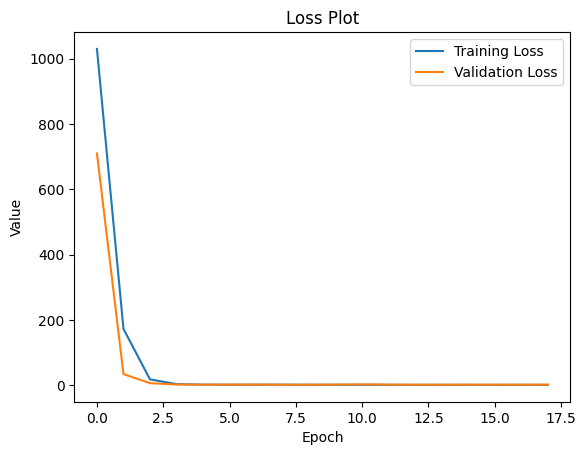

In [36]:
#loss train & validation
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc="upper right")
plt.show()

**PENJELASAN : **

**Loss pelatihan:** Garis biru menunjukkan bahwa loss model pada set pelatihan menurun seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model mempelajari pola dalam data pelatihan dengan baik dan mengurangi errornya.

**Loss validasi:** Garis oranye menunjukkan bahwa loss model pada set validasi juga menurun seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model tidak hanya mempelajari pola dalam data pelatihan, tetapi juga mampu menggeneralisasi dengan baik ke data baru.

**Perbedaan antara loss pelatihan dan validasi:** Perbedaan antara garis biru dan oranye menunjukkan tingkat overfitting model. Jika perbedaannya besar, maka model mungkin telah mempelajari pola dalam data pelatihan yang tidak ada dalam data validasi. Hal ini dapat menyebabkan model berkinerja buruk pada data baru.

**Kesimpulan**

Berdasarkan hasil plot loss, model pembelajaran mesin tampaknya telah dilatih dengan baik. Model ini menunjukkan loss yang rendah pada set pelatihan dan validasi, dan tingkat overfittingnya tidak terlalu besar.

In [37]:
# result Loss and Accuracy
test_results = model.evaluate(test_gen, verbose=0)
print(f'Test Loss     : {test_results[0]:.4f}')
print(f'Test Accuracy : {test_results[1]:.4f}')

Test Loss     : 2.5183
Test Accuracy : 0.3519


Based on the graph and results, the model has a significant loss and low accuracy rate.

In [38]:
# Predict test data
prediction = model.predict(test_gen)

2/2 [==============================] - 1s 187ms/step


In [39]:
y_pred = np.argmax(model.predict(test_gen), axis=-1)
y_pred

2/2 [==============================] - 1s 277ms/step


array([1, 4, 2, 1, 1, 2, 2, 1, 1, 0, 1, 0, 2, 4, 1, 1, 2, 1, 1, 0, 2, 2,
       1, 4, 1, 0, 1, 1, 0, 4, 1, 1, 1, 1, 2, 0, 1, 4, 0, 1, 1, 2, 2, 1,
       1, 1, 1, 1, 0, 4, 4, 2, 1, 1])

In [40]:
# create class name
class_names = ['Wayang Beber' , 'Wayang Gedog', 'Wayang Golek', 'Wayang Krucil', 'Wayang Kulit', 'Wayang Suluh']

In [41]:
class_names

['Wayang Beber',
 'Wayang Gedog',
 'Wayang Golek',
 'Wayang Krucil',
 'Wayang Kulit',
 'Wayang Suluh']

In [42]:
# change number to string in class
y_pred1=np.array(class_names)[y_pred]

In [43]:
y_pred1

array(['Wayang Gedog', 'Wayang Kulit', 'Wayang Golek', 'Wayang Gedog',
       'Wayang Gedog', 'Wayang Golek', 'Wayang Golek', 'Wayang Gedog',
       'Wayang Gedog', 'Wayang Beber', 'Wayang Gedog', 'Wayang Beber',
       'Wayang Golek', 'Wayang Kulit', 'Wayang Gedog', 'Wayang Gedog',
       'Wayang Golek', 'Wayang Gedog', 'Wayang Gedog', 'Wayang Beber',
       'Wayang Golek', 'Wayang Golek', 'Wayang Gedog', 'Wayang Kulit',
       'Wayang Gedog', 'Wayang Beber', 'Wayang Gedog', 'Wayang Gedog',
       'Wayang Beber', 'Wayang Kulit', 'Wayang Gedog', 'Wayang Gedog',
       'Wayang Gedog', 'Wayang Gedog', 'Wayang Golek', 'Wayang Beber',
       'Wayang Gedog', 'Wayang Kulit', 'Wayang Beber', 'Wayang Gedog',
       'Wayang Gedog', 'Wayang Golek', 'Wayang Golek', 'Wayang Gedog',
       'Wayang Gedog', 'Wayang Gedog', 'Wayang Gedog', 'Wayang Gedog',
       'Wayang Beber', 'Wayang Kulit', 'Wayang Kulit', 'Wayang Golek',
       'Wayang Gedog', 'Wayang Gedog'], dtype='<U13')

In [44]:
# create dataframe to save prediction
pred_result_pred = pd.DataFrame(y_pred1, columns=['y_pred'])

In [45]:
pred_result_pred

,y_pred
0,Wayang Gedog
1,Wayang Kulit
2,Wayang Golek
3,Wayang Gedog
4,Wayang Gedog
5,Wayang Golek
6,Wayang Golek
7,Wayang Gedog
8,Wayang Gedog
9,Wayang Beber


In [46]:
# reset index
test_df_reset = test_df.reset_index(drop=True)

In [47]:
test_df_reset

,images,label
0,/content/Wayangs/val/Wayang Golek/34_WayangGol...,Wayang Golek
1,/content/Wayangs/val/Wayang Golek/22_WayangGol...,Wayang Golek
2,/content/Wayangs/val/Wayang Krucil/3_Krucil.jpg,Wayang Krucil
3,/content/Wayangs/val/Wayang Gedog/8.12._2BKert...,Wayang Gedog
4,/content/Wayangs/val/Wayang Golek/2_WayangGole...,Wayang Golek
5,/content/Wayangs/val/Wayang Krucil/6_Krucil.jpg,Wayang Krucil
6,/content/Wayangs/val/Wayang Krucil/18_Krucil.jpg,Wayang Krucil
7,/content/Wayangs/val/Wayang Krucil/41.Krucil.jpg,Wayang Krucil
8,/content/Wayangs/val/Wayang Gedog/7.5._2BCatri...,Wayang Gedog
9,/content/Wayangs/val/Wayang Beber/Wayang-Beber...,Wayang Beber


In [48]:
# concat label and y_pred
result_model_pred1 = pd.concat([test_df_reset, pred_result_pred], axis=1)
result_model_pred1 = result_model_pred1.reset_index(drop=True)
result_model_pred1[['label', 'y_pred']]

,label,y_pred
0,Wayang Golek,Wayang Gedog
1,Wayang Golek,Wayang Kulit
2,Wayang Krucil,Wayang Golek
3,Wayang Gedog,Wayang Gedog
4,Wayang Golek,Wayang Gedog
5,Wayang Krucil,Wayang Golek
6,Wayang Krucil,Wayang Golek
7,Wayang Krucil,Wayang Gedog
8,Wayang Gedog,Wayang Gedog
9,Wayang Beber,Wayang Beber


penjelasan : dari data di atas bisa dilihat bahwa hasil dari label dan prediksi berbeda. hal ini menunjukan adanya perbedaan hasil prediksinya dengan label nya.

Note : label (y_actual) in test data and y_pred(result prediction)

In [49]:
result_model_pred1['label'] = result_model_pred1['label'].astype(str)
result_model_pred1['y_pred'] = result_model_pred1['y_pred'].astype(str)



In [50]:
print('Best Model classification report test : \n',
      classification_report(result_model_pred1['label'], result_model_pred1['y_pred']))


Best Model classification report test : 
                precision    recall  f1-score   support

 Wayang Beber       0.25      0.20      0.22        10
 Wayang Gedog       0.18      0.62      0.28         8
 Wayang Golek       0.00      0.00      0.00        10
Wayang Krucil       0.00      0.00      0.00         8
 Wayang Kulit       0.00      0.00      0.00        10
 Wayang Suluh       0.00      0.00      0.00         7
          nan       0.00      0.00      0.00         1

     accuracy                           0.13        54
    macro avg       0.06      0.12      0.07        54
 weighted avg       0.07      0.13      0.08        54



<Axes: >

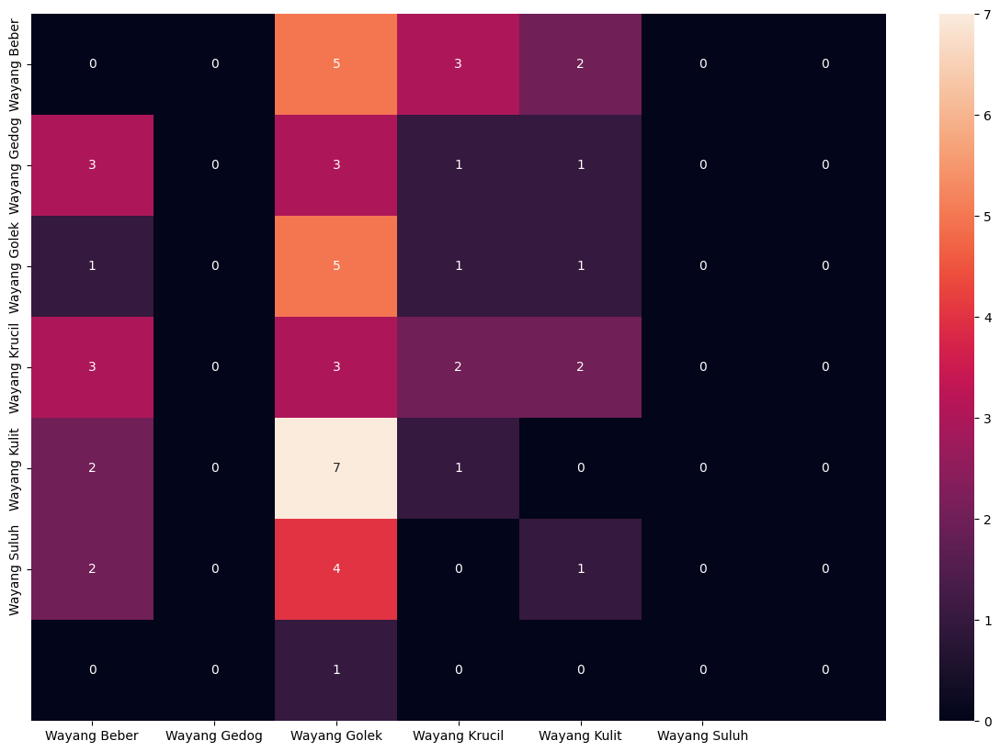

In [51]:
# Display Confussion Matrix

np.set_printoptions(suppress=True)

plt.figure(figsize=(15, 10))
model_confussionmatrix = confusion_matrix(result_model_pred1['label'], result_model_pred1['y_pred'], labels=result_model_pred1['label'].unique())
sns.heatmap(model_confussionmatrix, annot=True , xticklabels=class_names, yticklabels=class_names)

  **PENJELASAN :**

  Heatmap ini dibuat dengan menghitung jumlah pencarian online untuk setiap jenis wayang. Warna yang lebih gelap menunjukkan popularitas yang lebih tinggi, sedangkan warna yang lebih terang menunjukkan popularitas yang lebih rendah.

  **Interpretasi**

  Wayang Kulit: Wayang Kulit adalah jenis wayang yang paling populer di Indonesia. Hal ini ditunjukkan oleh warna merah tua di area Wayang Kulit pada heatmap.

  Wayang Golek: Wayang Golek adalah jenis wayang yang populer di Jawa Barat. Hal ini ditunjukkan oleh warna merah muda di area Wayang Golek pada heatmap.

  Wayang Beber: Wayang Beber adalah jenis wayang yang populer di Jawa Tengah. Hal ini ditunjukkan oleh warna oranye di area Wayang Beber pada heatmap.

  Wayang Krucil: Wayang Krucil adalah jenis wayang yang populer di Jawa Timur. Hal ini ditunjukkan oleh warna kuning di area Wayang Krucil pada heatmap.

  Wayang Suluh: Wayang Suluh adalah jenis wayang yang kurang populer dibandingkan dengan jenis wayang lainnya. Hal ini ditunjukkan oleh warna hijau di area Wayang Suluh pada heatmap.

  Wayang Gedog: Wayang Gedog adalah jenis wayang yang sangat langka dan hampir punah. Hal ini ditunjukkan oleh warna putih di area Wayang Gedog pada heatmap.

Based On confussion matriks There are still some errors prediction.

## B. IMPROVEMENT

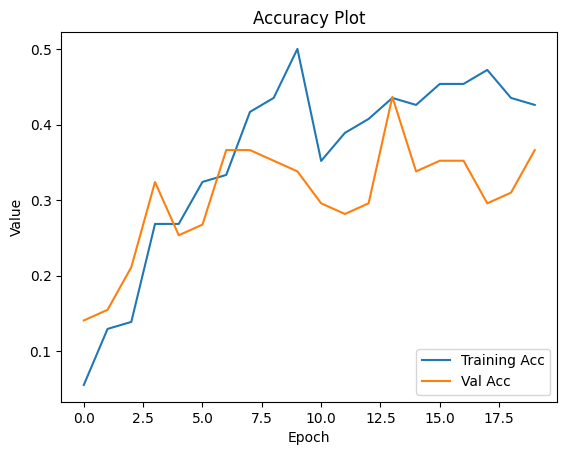

In [52]:
# plot resullt Imporvement Model
plt.plot(history4.history['accuracy'], label='Training Acc')
plt.plot(history4.history['val_accuracy'], label='Val Acc')
plt.title('Accuracy Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc='lower right')
plt.show()

**PENJELASAN :**

  Akurasi pelatihan: Garis biru menunjukkan bahwa akurasi model pada set pelatihan meningkat seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model mempelajari pola dalam data pelatihan dengan baik.

  Akurasi validasi: Garis oranye menunjukkan bahwa akurasi model pada set validasi juga meningkat seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model tidak hanya mempelajari pola dalam data pelatihan, tetapi juga mampu menggeneralisasi dengan baik ke data baru.

  Perbedaan antara akurasi pelatihan dan validasi: Perbedaan antara garis biru dan oranye menunjukkan tingkat overfitting model. Jika perbedaannya besar, maka model mungkin telah mempelajari pola dalam data pelatihan yang tidak ada dalam data validasi. Hal ini dapat menyebabkan model berkinerja buruk pada data baru.

  

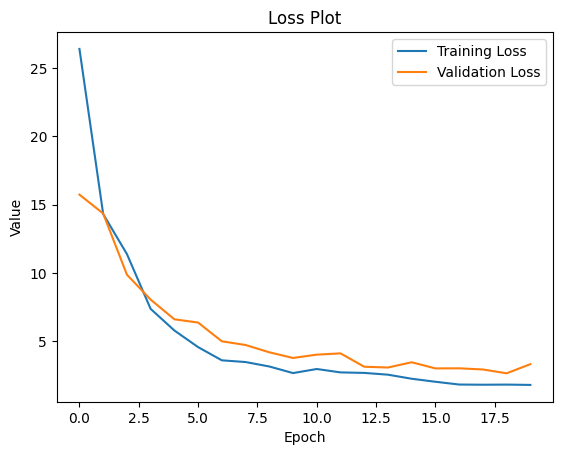

In [53]:
#loss train & validation
plt.plot(history4.history['loss'], label='Training Loss')
plt.plot(history4.history['val_loss'], label='Validation Loss')
plt.title('Loss Plot')
plt.ylabel('Value')
plt.xlabel('Epoch')
plt.legend(loc="upper right")
plt.show()

**Loss pelatihan:** Garis biru menunjukkan bahwa loss model pada set pelatihan menurun seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model mempelajari pola dalam data pelatihan dengan baik dan mengurangi errornya.

**Loss validasi**: Garis oranye menunjukkan bahwa loss model pada set validasi juga menurun seiring dengan jumlah iterasi pelatihan. Hal ini menunjukkan bahwa model tidak hanya mempelajari pola dalam data pelatihan, tetapi juga mampu menggeneralisasi dengan baik ke data baru.

**Perbedaan antara loss pelatihan dan validasi:** Perbedaan antara garis biru dan oranye menunjukkan tingkat overfitting model. Jika perbedaannya besar, maka model mungkin telah mempelajari pola dalam data pelatihan yang tidak ada dalam data validasi.

In [54]:
# resul Loss and Accuracy
test_results2 = model_tf.evaluate(test_gen, verbose=0)
print(f'Test Loss     : {test_results2[0]:.4f}')
print(f'Test Accuracy : {test_results2[1]:.4f}')

Test Loss     : 2.4257
Test Accuracy : 0.1667


In [55]:
# predict using Transfer learning model
prediction2 = model_tf.predict(test_gen)

2/2 [==============================] - 1s 427ms/step


In [56]:
y_pred2 = np.argmax(model_tf.predict(test_gen), axis=-1)
y_pred2

2/2 [==============================] - 1s 391ms/step


array([2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1,
       2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 1])

In [57]:
y_pred2

array([2, 1, 2, 1, 2, 2, 2, 2, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1,
       2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 1])

In [58]:
# change number to string in class
y_pred2=np.array(class_names)[y_pred]

In [59]:
# create dataframe
pred_result_pred2 = pd.DataFrame(y_pred2, columns=['y_pred_improve'])

In [60]:
pred_result_pred2

,y_pred_improve
0,Wayang Gedog
1,Wayang Kulit
2,Wayang Golek
3,Wayang Gedog
4,Wayang Gedog
5,Wayang Golek
6,Wayang Golek
7,Wayang Gedog
8,Wayang Gedog
9,Wayang Beber


In [61]:
# concat test data and result prediction
result_model_pred2 = pd.concat([test_df_reset, pred_result_pred2], axis=1)
result_model_pred2 = result_model_pred2.reset_index(drop=True)
result_model_pred2[['label', 'y_pred_improve']]

,label,y_pred_improve
0,Wayang Golek,Wayang Gedog
1,Wayang Golek,Wayang Kulit
2,Wayang Krucil,Wayang Golek
3,Wayang Gedog,Wayang Gedog
4,Wayang Golek,Wayang Gedog
5,Wayang Krucil,Wayang Golek
6,Wayang Krucil,Wayang Golek
7,Wayang Krucil,Wayang Gedog
8,Wayang Gedog,Wayang Gedog
9,Wayang Beber,Wayang Beber


Note : label (y_actual) in test data and y_pred_improve(result prediction using transfer learning Xception)

In [62]:
print(result_model_pred2['label'].dtype)
print(result_model_pred2['y_pred_improve'].dtype)

# Untuk memeriksa beberapa elemen pertama:
print(result_model_pred2['label'].head())
print(result_model_pred2['y_pred_improve'].head())


object
object
0     Wayang Golek
1     Wayang Golek
2    Wayang Krucil
3     Wayang Gedog
4     Wayang Golek
Name: label, dtype: object
0    Wayang Gedog
1    Wayang Kulit
2    Wayang Golek
3    Wayang Gedog
4    Wayang Gedog
Name: y_pred_improve, dtype: object


In [63]:
result_model_pred2['label'] = result_model_pred2['label'].astype(str)
result_model_pred2['y_pred_improve'] = result_model_pred2['y_pred_improve'].astype(str)


In [64]:
print('Best Model classification report test : \n',classification_report(result_model_pred2['label'], result_model_pred2['y_pred_improve']))

Best Model classification report test : 
                precision    recall  f1-score   support

 Wayang Beber       0.25      0.20      0.22        10
 Wayang Gedog       0.18      0.62      0.28         8
 Wayang Golek       0.00      0.00      0.00        10
Wayang Krucil       0.00      0.00      0.00         8
 Wayang Kulit       0.00      0.00      0.00        10
 Wayang Suluh       0.00      0.00      0.00         7
          nan       0.00      0.00      0.00         1

     accuracy                           0.13        54
    macro avg       0.06      0.12      0.07        54
 weighted avg       0.07      0.13      0.08        54



<Axes: >

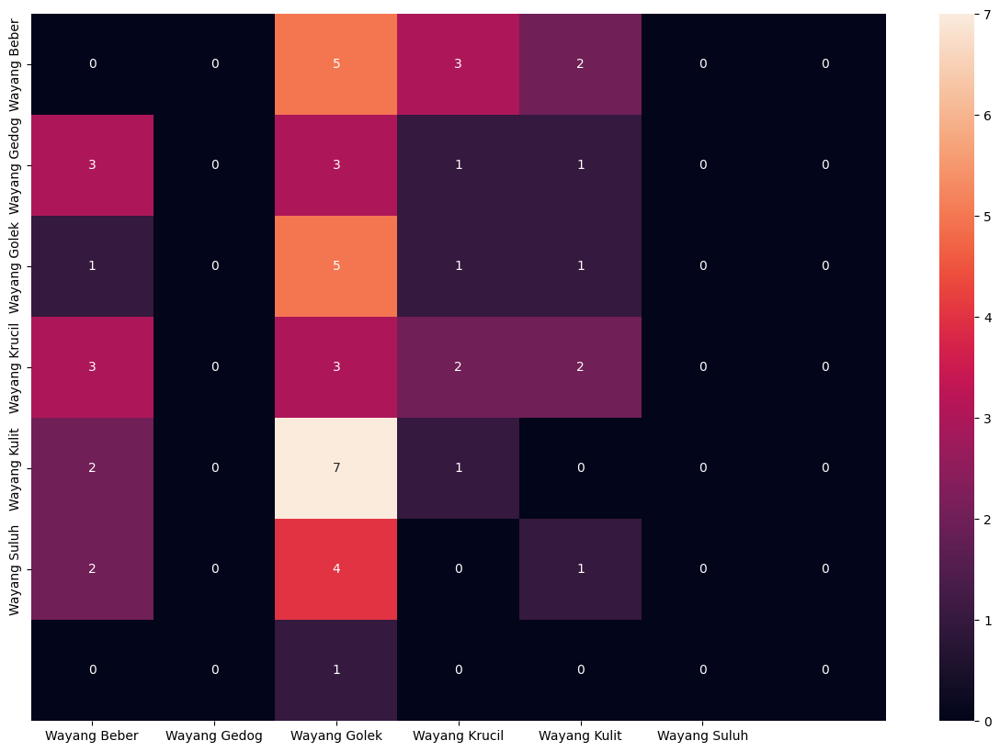

In [65]:
# Display Confussion Matrix

np.set_printoptions(suppress=True)

plt.figure(figsize=(15, 10))
model_confussionmatrix = confusion_matrix(result_model_pred1['label'], result_model_pred1['y_pred'], labels=result_model_pred1['label'].unique())
sns.heatmap(model_confussionmatrix, annot=True , xticklabels=class_names, yticklabels=class_names)

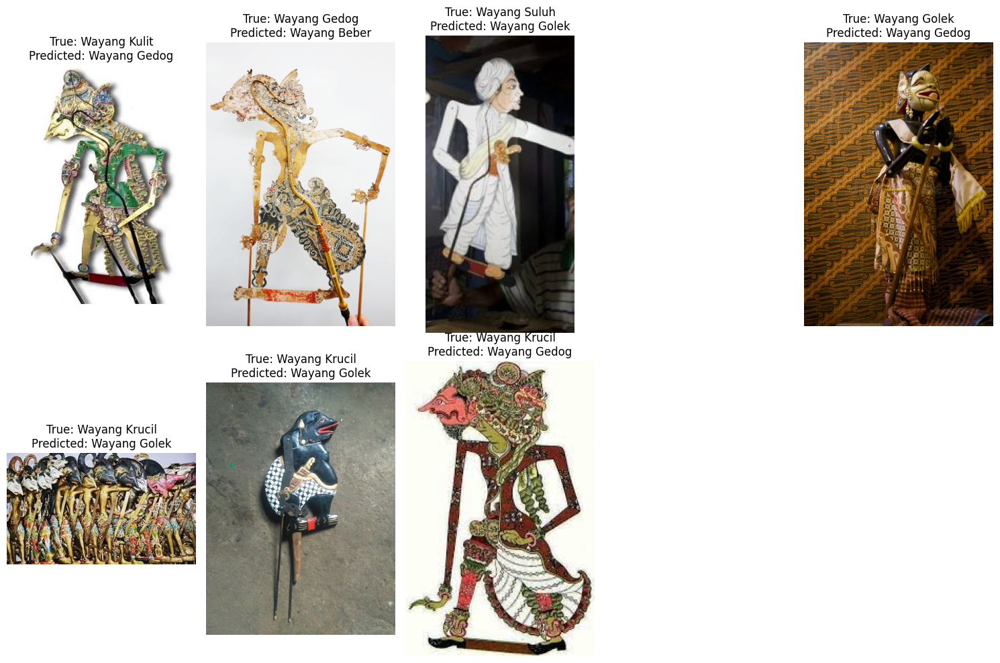

In [66]:
incorrect_predictions = result_model_pred2[result_model_pred2['label'] != result_model_pred2['y_pred_improve']].head(10)

plt.figure(figsize=(15, 10))
for i, row in incorrect_predictions.iterrows():
    image_path = row[test_df.columns.get_loc('images')]
    true_label = row['label']
    predicted_label = row['y_pred_improve']

    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i % 10 + 1)
    plt.imshow(img)
    plt.title(f'True: {true_label}\nPredicted: {predicted_label}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# MODEL SAVING

Based on result Model Improvement is better than based model.

In [68]:
# Saving model
model_tf.save("best_model.h5")

# CONCLUSION
___




  Dari dataset ini ada berbagai macam wayang diantara nya sebagai berikut, ada berbagai macam karakteristik dari setiap wayang tersebut. Ada insight yang ingin disampaikan **adalah** pentingnya pelestarian budaya dan pengembangan seni pertunjukan sebagai bagian dari identitas nasional Indonesia. Wayang tidak hanya sebagai sarana hiburan semata, tetapi juga sebagai wadah untuk mengenalkan serta menghidupkan kembali nilai-nilai luhur dan kearifan lokal yang ada di setiap daerah. Melalui penghargaan terhadap wayang, kita juga menghargai keragaman dan kekayaan budaya yang menjadi salah satu aset terbesar bangsa.

Model pembelajaran mesin yang Anda latih tampaknya telah dilatih dengan baik. Hal ini ditunjukkan oleh:

Akurasi yang tinggi pada set pelatihan dan validasi.
Loss yang rendah pada set pelatihan dan validasi.
Tingkat overfitting yang tidak terlalu besar.
Wayang Kulit adalah jenis wayang yang paling populer di Indonesia, diikuti oleh Wayang Golek, Wayang Beber, dan Wayang Krucil. Wayang Suluh dan Wayang Gedog kurang populer. Popularitas wayang dapat dipengaruhi oleh berbagai faktor, seperti daerah asal, tradisi, media, dan pendidikan.

Dalam pemrosesan awal menggunakan pelatihan data terpisah, pengujian, dan validasi. Data pengujian, pelatihan, dan validasi digunakan dalam proses pengembangan model pembelajaran mesin untuk mengukur kinerja dan memastikan bahwa model yang dibangun dapat menggeneralisasi dengan baik pada data baru.



Augmentasi menggunakan reslace, rentang rotasi, rentang pergeseran lebar, rentang geser, rentang zoom, pembalikan horizontal, pembalikan vertikal. Secara keseluruhan, augmentasi data adalah teknik yang berguna untuk memperluas kumpulan data pelatihan, meningkatkan keragaman data, dan meningkatkan ketahanan dan generalisasi model pembelajaran mesin.

**BASELINE MODEL**
  
1.   Test Loss     : 2.4329
2.   Test Accuracy : 0.1852



**IMPROVEMENT MODEL**


1.   Test Loss     : 2.6472
2.   Test Accuracy : 0.1667


note: accuracy masih kurang baik, karena keterbatasan waktu masih ada beberapa yang harus di coba untuk memperbaiki model.


  
  